In [109]:
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#import sklearn libraries
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, accuracy_score, roc_auc_score, roc_curve

#ignore harmless warnings
import warnings
warnings.filterwarnings('ignore')

In [5]:
#import data and display dimensions
df = pd.read_csv('indian_liver_patient.csv')
df.shape

(583, 11)

In [7]:
#sample data
df.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1


In [9]:
#null value check
df.isna().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    4
Dataset                       0
dtype: int64

In [19]:
#handle null values
df['Albumin_and_Globulin_Ratio'].fillna(df['Albumin_and_Globulin_Ratio'].median(), inplace=True)
df.isna().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    0
Dataset                       0
dtype: int64

In [47]:
#check duplicates
print(f'data haved {df[df.duplicated()].shape[0]} duplicate rows, which is {round(df[df.duplicated()].shape[0]/len(df)*100,2)}% of entire data; So, it does not metter if remove it or not')
print('As we dont have much data to work with I will not remove duplicates, as it has posibility that thoes records are genuine.')

data haved 13 duplicate rows, which is 2.23% of entire data; So, it does not metter if remove it or not
As we dont have much data to work with I will not remove duplicates, as it has posibility that thoes records are genuine.


In [55]:
#check data types
pd.concat([df.dtypes,df.head().T], axis=1)

,0,0,1,2,3,4
Age,int64,65,62,62,58,72
Gender,object,Female,Male,Male,Male,Male
Total_Bilirubin,float64,0.7,10.9,7.3,1.0,3.9
Direct_Bilirubin,float64,0.1,5.5,4.1,0.4,2.0
Alkaline_Phosphotase,int64,187,699,490,182,195
Alamine_Aminotransferase,int64,16,64,60,14,27
Aspartate_Aminotransferase,int64,18,100,68,20,59
Total_Protiens,float64,6.8,7.5,7.0,6.8,7.3
Albumin,float64,3.3,3.2,3.3,3.4,2.4
Albumin_and_Globulin_Ratio,float64,0.9,0.74,0.89,1.0,0.4


In [57]:
#check categorical data
df['Gender'].value_counts()

Gender
Male      441
Female    142
Name: count, dtype: int64

In [61]:
#encode categorical data
df['Gender'] = df['Gender'].map({'Male':0,'Female':1})
df['Gender'].value_counts()

Gender
0    441
1    142
Name: count, dtype: int64

Dataset
1    71.35506
2    28.64494
Name: proportion, dtype: float64


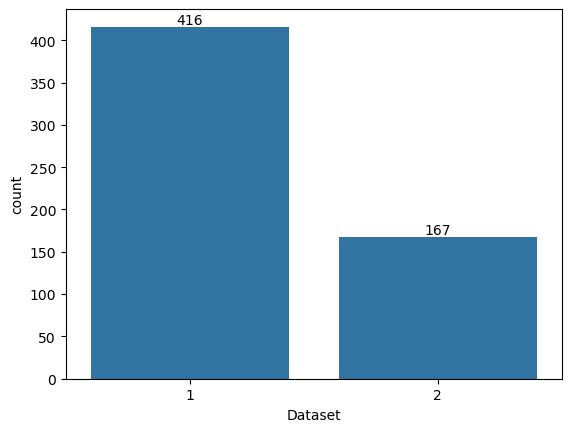

In [83]:
#understand target variable
print(df['Dataset'].value_counts(normalize=True)*100)

ax = sns.barplot(df['Dataset'].value_counts())
ax.bar_label(ax.containers[0])
plt.show()

Target data is not balanced and we do not have less data to train our model. 

Do upsampling to handle bias as well as we will have more data fro model training

In [87]:
#upsamplingg
from imblearn.over_sampling import SMOTE

x = df.drop('Dataset',axis=1)
y = df['Dataset']

smote = SMOTE()
x_sampled, y_sampled = smote.fit_resample(x,y)

print(y_sampled.value_counts(normalize=True)*100)

Dataset
1    50.0
2    50.0
Name: proportion, dtype: float64


In [89]:
#data dimension after upsampling 
df = pd.concat([x_sampled,y_sampled], axis=1)
df.shape

(832, 11)

In [105]:
!pip install ydata-profiling

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/393.5 kB ? eta -:--:--
   ----------------- ---------------------- 174.1/393.5 kB 3.5 MB/s eta 0:00:01
   ---------------------------------------- 393.5/393.5 kB 4.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/296.5 kB ? eta -:--:--
   -------------------------------------- - 286.7/296.5 kB 8.9 MB/s eta 0:00:01
   ---------------------------------------- 296.5/296.5 kB 9.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/666.4 kB ? eta -:--:--
   --------------------------- ------------ 450.6/666.4 kB 9.4 MB/s eta 0:00:01
   ---------------------------------------- 666.4/666.4 kB 7.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/105.4 kB ? eta -:--:--
   ---------------------------------------- 105.4/105.4 kB ? eta 0:00:00
   ---------------------------------------- 0.0/301.2 kB ? et

In [107]:
import ydata_profiling as yp
profile = yp.ProfileReport(df)
profile.to_notebook_iframe()
profile.to_file('eda_report.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [93]:
#train test split

x_train, x_test, y_train, y_test = train_test_split(x_sampled, y_sampled, test_size=0.2, random_state=42)

#dimensions after split
print('x_train: ',x_train.shape)
print('y_train: ',y_train.shape)
print('x_test: ',x_test.shape)
print('y_test: ',y_test.shape)

x_train:  (665, 10)
y_train:  (665,)
x_test:  (167, 10)
y_test:  (167,)


In [117]:
#model training

model = RandomForestClassifier()
model.fit(x_train,y_train)

y_pred = model.predict(x_test)

print('Accuracy score: ',round(accuracy_score(y_test, y_pred)*100,2),'%')

Accuracy score:  81.44 %


Classification Report:

               precision    recall  f1-score   support

           1       0.78      0.83      0.80        75
           2       0.85      0.80      0.83        92

    accuracy                           0.81       167
   macro avg       0.81      0.82      0.81       167
weighted avg       0.82      0.81      0.81       167



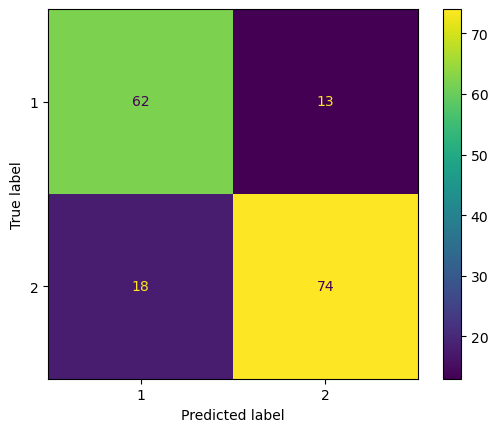

In [121]:
print('Classification Report:\n\n', classification_report(y_test, y_pred))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

In [159]:
auc_score = roc_auc_score(y_test, y_pred)
auc_score

0.8155072463768116

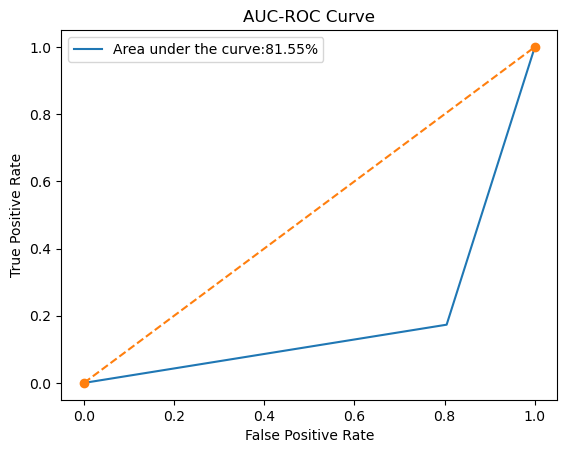

In [161]:
fpr, tpr, thr = roc_curve(y_test, y_pred, pos_label=1)

plt.plot(fpr,tpr,label=f'Area under the curve:{round(auc_score*100,2)}%')
plt.plot([0,1],[0,1],linestyle='dashed', marker='o')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.title('AUC-ROC Curve')
plt.show()